In [255]:
import scvelo as scv
import scanpy as sc
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [256]:
adata = scv.read('/media/chang/HDD-2/chang/ys_velo.h5ad')

In [296]:
adata.uns['root'] = adata.obs['leiden'].isin(['6'])
adata.obs_names[adata.uns['root']]
#adata.uns['root']

Index(['19', '31', '34', '35', '43', '49', '53', '57', '60', '63',
       ...
       '5598', '5821', '5926', '5977', '6054', '6158', '6160', '6437', '6444',
       '6504'],
      dtype='object', name='index', length=408)

In [97]:
import pandas as pd
pd.DataFrame(adata.obsm['X_umap']).to_csv('/media/chang/HDD-2/chang/ys_velo_umap.csv', index=False)
pd.DataFrame(adata.obs['leiden']).to_csv('/media/chang/HDD-2/chang/ys_leiden.csv', index=False)

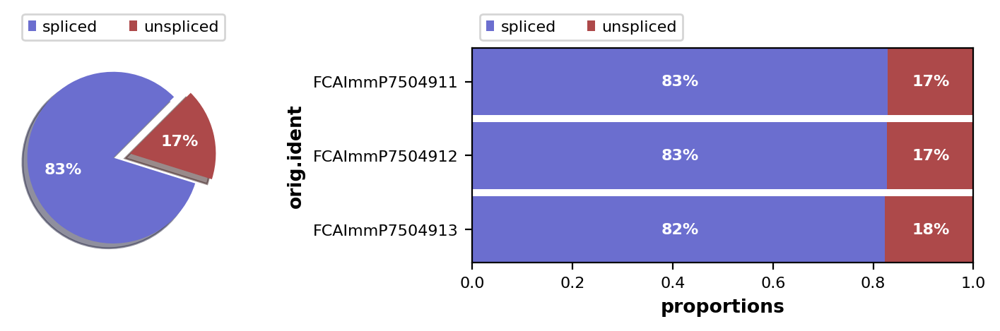

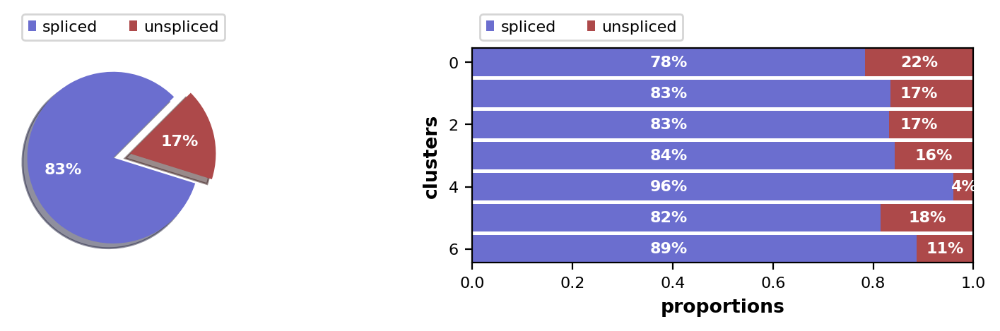

In [257]:
scv.pl.proportions(adata, groupby='orig.ident')
adata.obs['clusters'] = adata.obs['clusters'].astype('category')
scv.pl.proportions(adata, groupby='clusters')

In [258]:
scv.pp.filter_and_normalize(adata, min_shared_counts=5, n_top_genes=3000, enforce=True)

Filtered out 45573 genes that are detected 5 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 3000 highly variable genes.
Logarithmized X.


In [124]:
#adata.obs['leiden'].loc[adata.obs['leiden'] == '3'] = '2'
#adata.obs['leiden'].loc[adata.obs['clusters'] == '8'] = '4'
adata.obs['clusters'] = adata.obs['leiden'].astype('category')

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


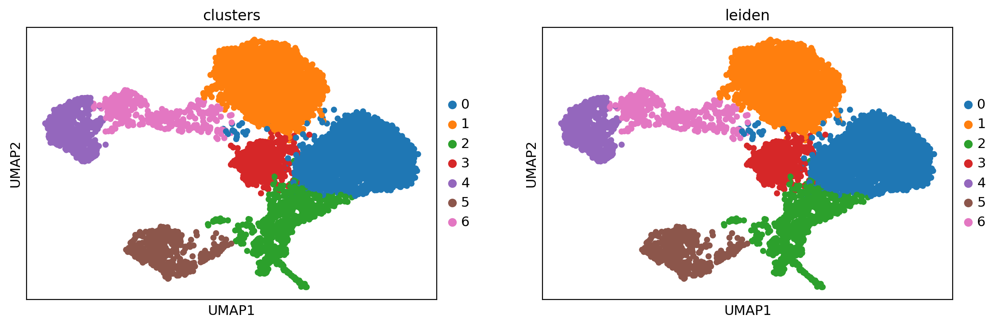

In [259]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=30)
#sc.pl.pca_variance_ratio(adata, log=True,  n_pcs=50)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata, min_dist=.6)#.6 for current YS
#sc.tl.umap(adata, min_dist=.1, n_components =30, spread =5, alpha=1) #MG
scv.pp.moments(adata, n_pcs=30, n_neighbors=15)
sc.tl.leiden(adata, resolution=.3)
sc.pl.umap(adata, color=['clusters','leiden'], size=100)
##sc.tl.embedding_density(adata, basis='umap')#, groupby='prox_dist')
##sc.pl.embedding_density(adata, basis='umap')#, key='umap_density_prox_dist', group='clusters')
##sc.tl.diffmap(adata, n_comps=20)
##sc.pl.diffmap(adata, color='clusters')#, groups='clusters')

In [260]:
scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

recovering dynamics
    finished (0:12:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


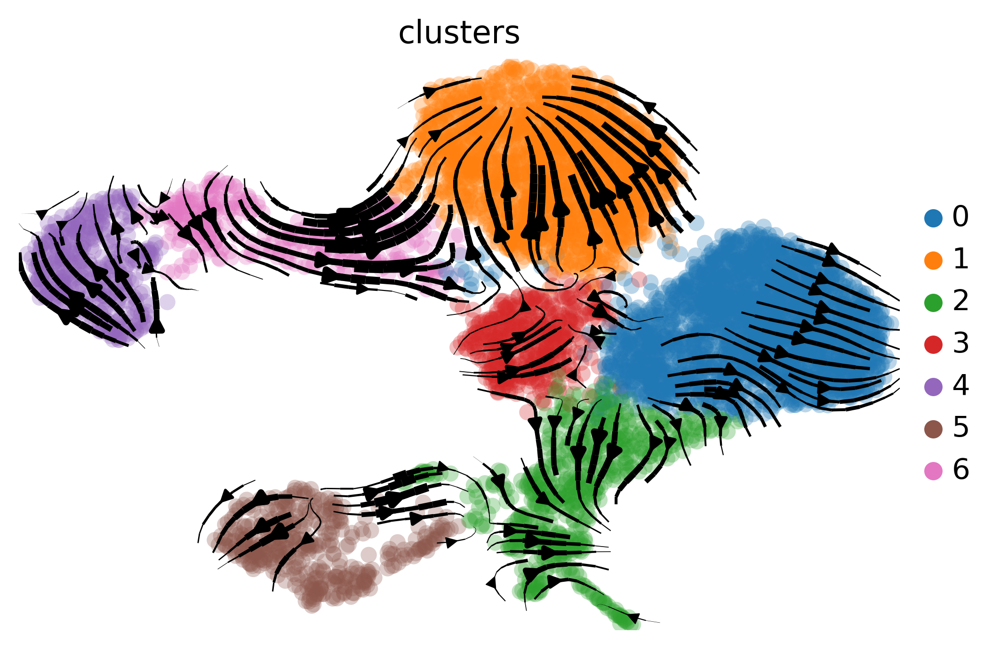

In [261]:
adata.obs['clusters'] = adata.obs['leiden'].astype('category')
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', dpi=200, linewidth=2)

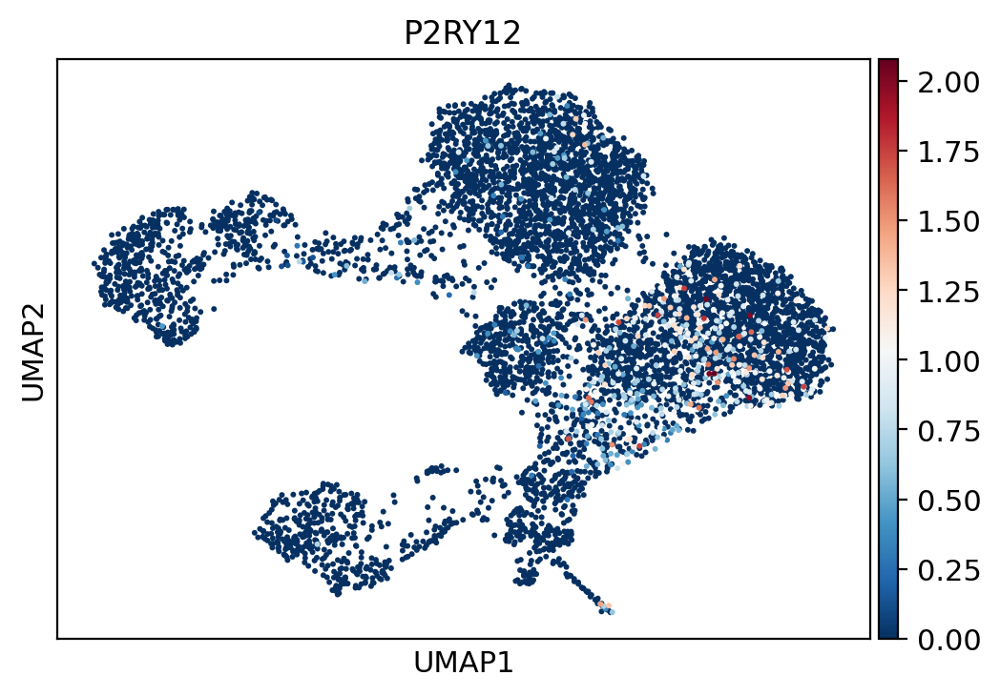

In [56]:
#scv.tl.latent_time(adata)
#scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=200)
#scv.pl.scatter(adata, x='latent_time', y=['AIF1','P2RY12'], frameon=False)
#sc.pl.umap(adata,color='P2RY12')
#adata.var_names

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


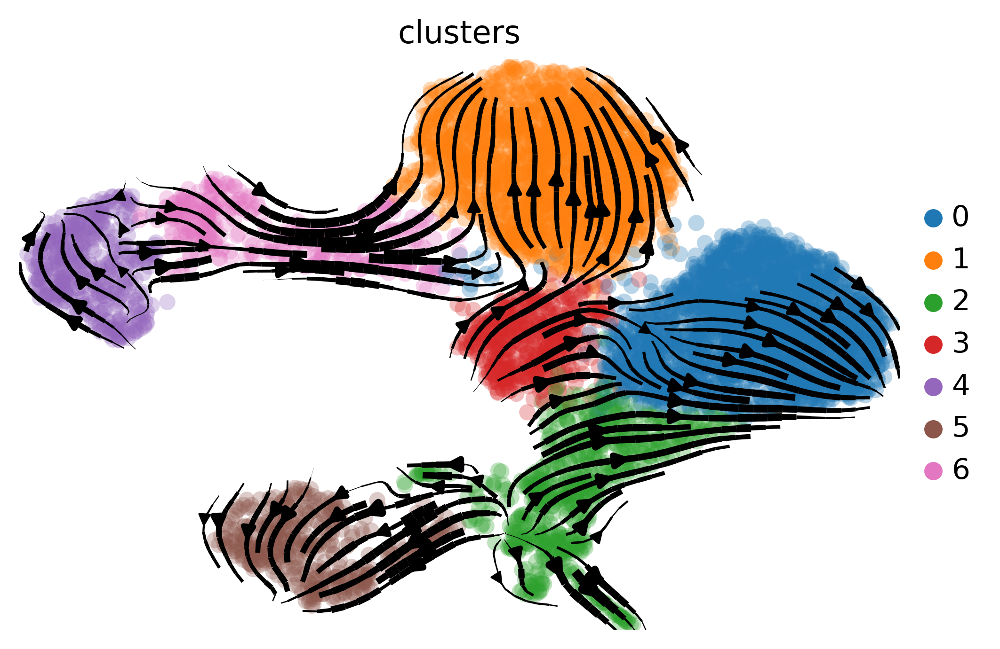

In [8]:
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', dpi=200,linewidth =2)
#sc.tl.embedding_density(adata, basis='umap')#, groupby='prox_dist')
#sc.pl.embedding_density(adata, basis='umap')

computing terminal states
    identified 3 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:03) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


AttributeError: module 'matplotlib.cbook' has no attribute 'iterable'

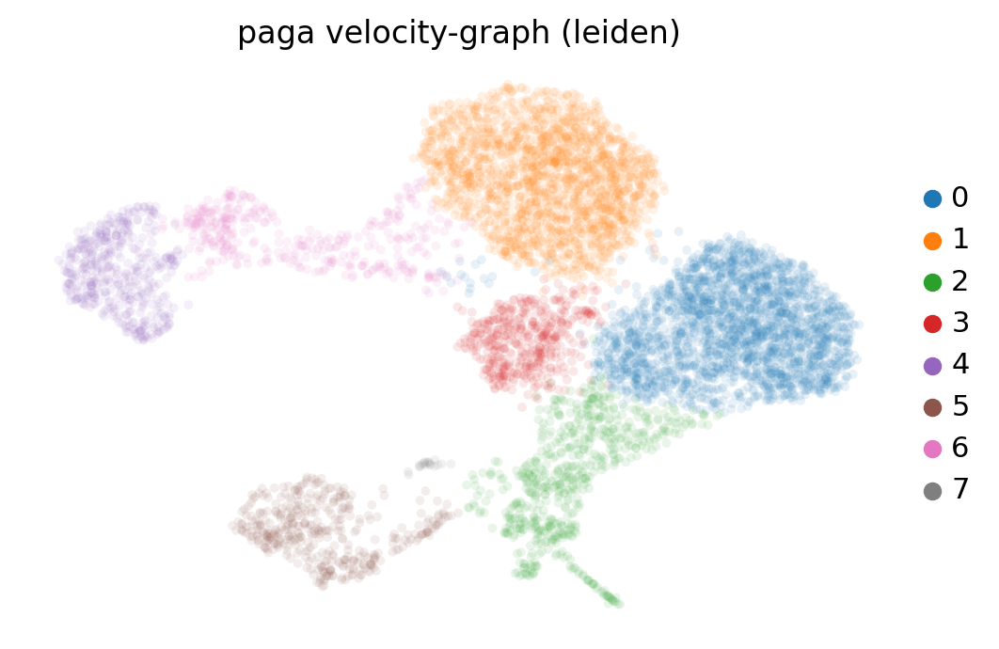

In [9]:
scv.tl.paga(adata, groups='leiden')
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [185]:
adata.write("/media/chang/HDD-2/chang/mg_velo2.h5ad")

Trying to set attribute `.uns` of view, copying.


recovering dynamics
... 1%WARNING: XIRP2 not recoverable due to insufficient samples.
... 4%WARNING: UPK1A-AS1 not recoverable due to insufficient samples.
... 11%WARNING: TM4SF19 not recoverable due to insufficient samples.
... 12%WARNING: SYCE1 not recoverable due to insufficient samples.
... 14%WARNING: SPDYC not recoverable due to insufficient samples.
... 15%WARNING: SLFN14 not recoverable due to insufficient samples.
... 17%WARNING: skipping bimodality check for SERPINB2
... 19%WARNING: SELENOOLP not recoverable due to insufficient samples.
... 21%WARNING: RHD not recoverable due to insufficient samples.
... 23%WARNING: RAPSN not recoverable due to insufficient samples.
... 30%WARNING: NXF3 not recoverable due to insufficient samples.
... 44%WARNING: skipping bimodality check for LIPH
... 50%WARNING: ITGA6-AS1 not recoverable due to insufficient samples.
... 52%WARNING: HTR2A not recoverable due to insufficient samples.
... 54%WARNING: HMGCS2 not recoverable due to insufficient s

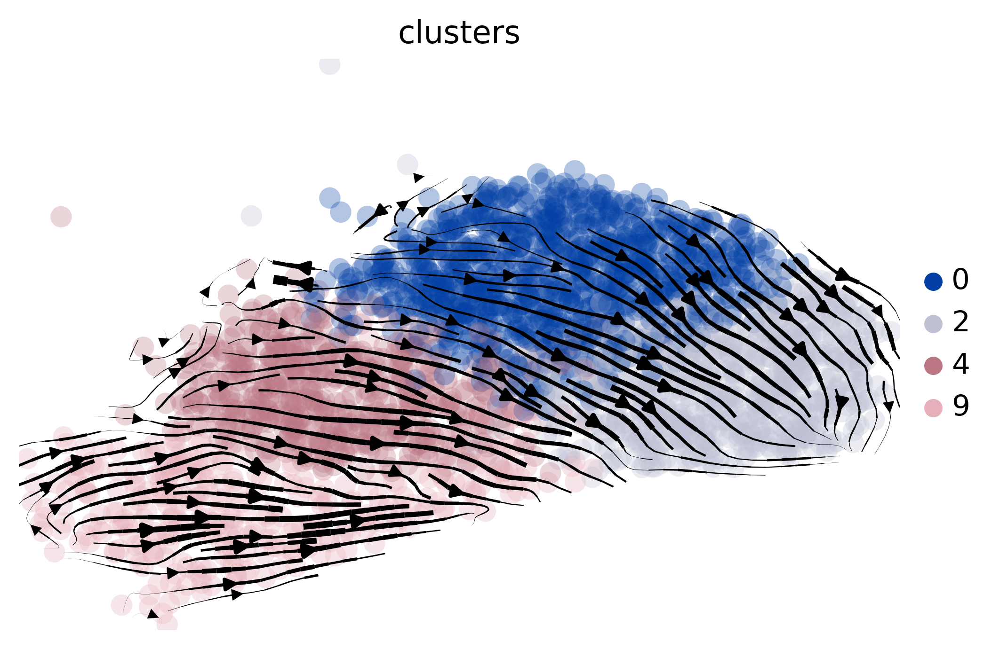

In [35]:
adata_new = adata[adata.obs['leiden'].isin(['0','2','4','9']),:]
#scv.pp.filter_genes(adata_new, min_shared_counts=5)
#sc.tl.pca(adata_new, svd_solver='arpack', n_comps=50)
#sc.pl.pca_variance_ratio(adata_new, log=True,  n_pcs=50)
#sc.pp.neighbors(adata_new, n_neighbors=15, n_pcs=30)
#sc.tl.umap(adata_new, min_dist=.6, n_components =30)
#scv.pp.moments(adata_new, n_pcs=30, n_neighbors=15)
#scv.tl.velocity(adata_new)
#scv.tl.velocity_graph(adata_new)
#scv.pl.velocity_embedding_stream(adata_new, basis='umap', legend_loc='right margin', dpi=200,linewidth =2)
scv.tl.recover_dynamics(adata_new)
scv.tl.velocity(adata_new, mode='dynamical')
scv.tl.velocity_graph(adata_new)
scv.pl.velocity_embedding_stream(adata_new, basis='umap', legend_loc='right margin', dpi=200,linewidth =2)

In [270]:
scv.tl.rank_dynamical_genes(adata_new, groupby='leiden')
top_genes = adata_new.var['fit_likelihood'].sort_values(ascending=False).index[:500]
#scv.tl.differential_kinetic_test(adata_new, var_names=top_genes, groupby='leiden')
scv.tl.velocity(adata_new, diff_kinetics=True)
scv.tl.velocity_graph(adata_new)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


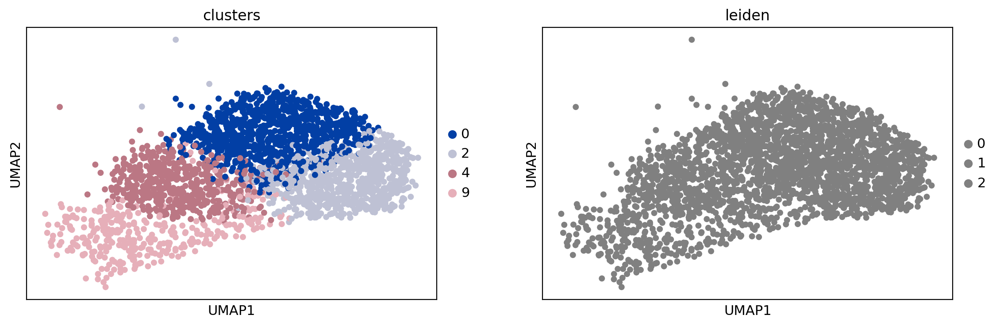

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


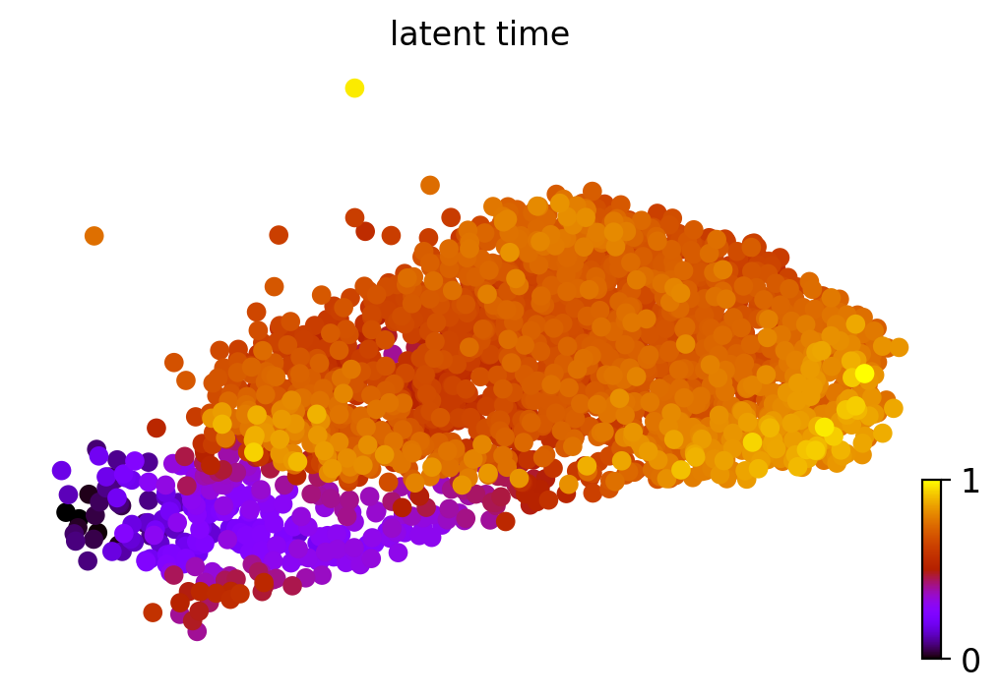

In [80]:
sc.tl.leiden(adata_new, resolution=.2)
#sc.tl.umap(adata_new, min_dist=.6)#.6 for current YS
sc.pl.umap(adata_new, color=['clusters','leiden'], size=100)
#scv.pl.velocity_embedding_stream(adata_new, basis='umap', legend_loc='right margin', dpi=100,linewidth =2)

#adata_new.obs['root'] = 0
#adata_new.obs['root'][adata_new.obs['leiden'].isin(['7'])] = 1
#adata_new.obs['root'] = adata_new.obs['root'].astype('float64')
scv.tl.latent_time(adata_new)#, root_key='root')
scv.pl.scatter(adata_new, color='latent_time', color_map='gnuplot', size=200)

In [145]:
import matplotlib.pyplot as plt

In [ ]:
plt.rcParams['figure.figsize'] = 50,100
#top_genes = adata.var['fit_likelihood'].sort_values(ascending=False)[:800,]
#top_genes
#scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', n_convolve=100, col_color='leiden')
#top_genes
#scv.tl.recover_dynamics(adata,var_names='all' )
#scv.tl.velocity(adata, mode='dynamical', filter_genes=False, use_highly_variable=False)
scv.pl.scatter(adata, x='latent_time', y=['HLA-DRA','HLA-DRB1','HLA-DPB1','CD74','SPP1','F13A1'],color='clusters',groups = [str(0),str(2)],frameon=False, ncols=6, dpi=300)

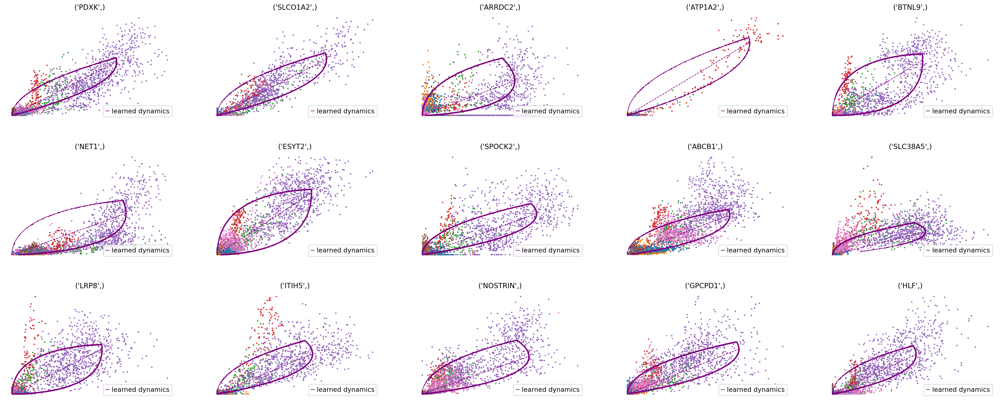

In [11]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)

In [278]:
scv.tl.rank_dynamical_genes(adata, groupby='clusters')
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:500]
#scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='clusters')

ranking genes by cluster-specific likelihoods
    finished (0:00:02) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)
testing for differential kinetics
    finished (0:02:31) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


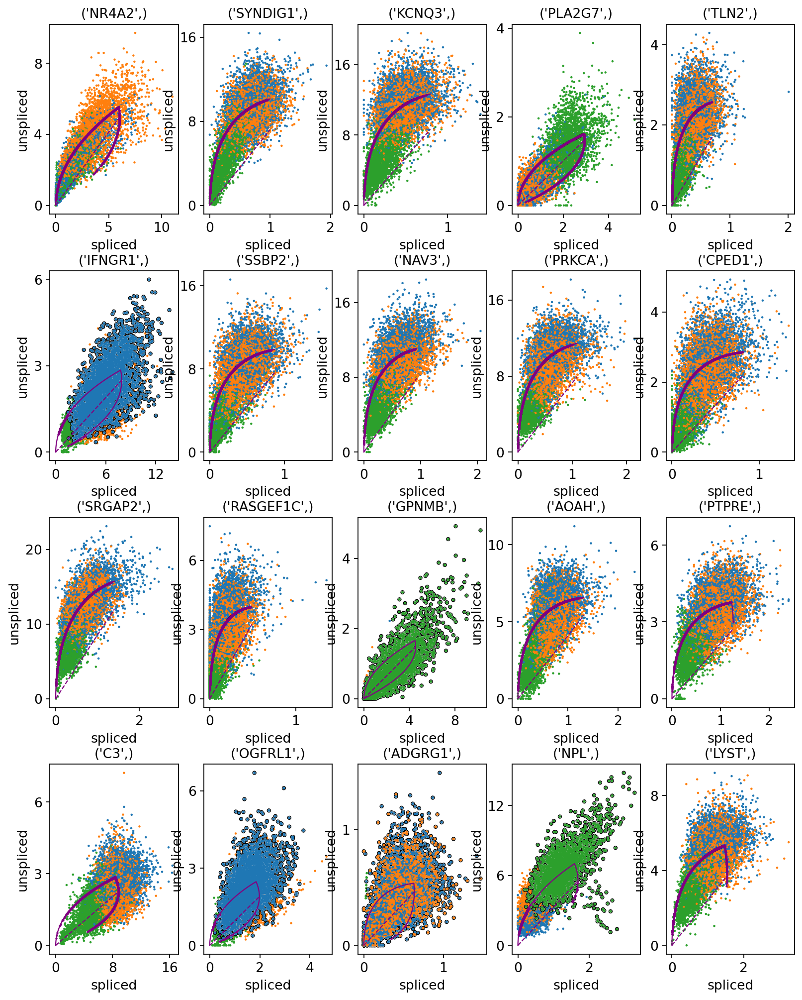

In [230]:
scv.pl.scatter(adata, basis=top_genes[:20], ncols=5, add_outline='fit_diff_kinetics', figsize=(50,80))

In [279]:
scv.tl.velocity(adata, diff_kinetics=True)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing terminal states
    identified 8 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


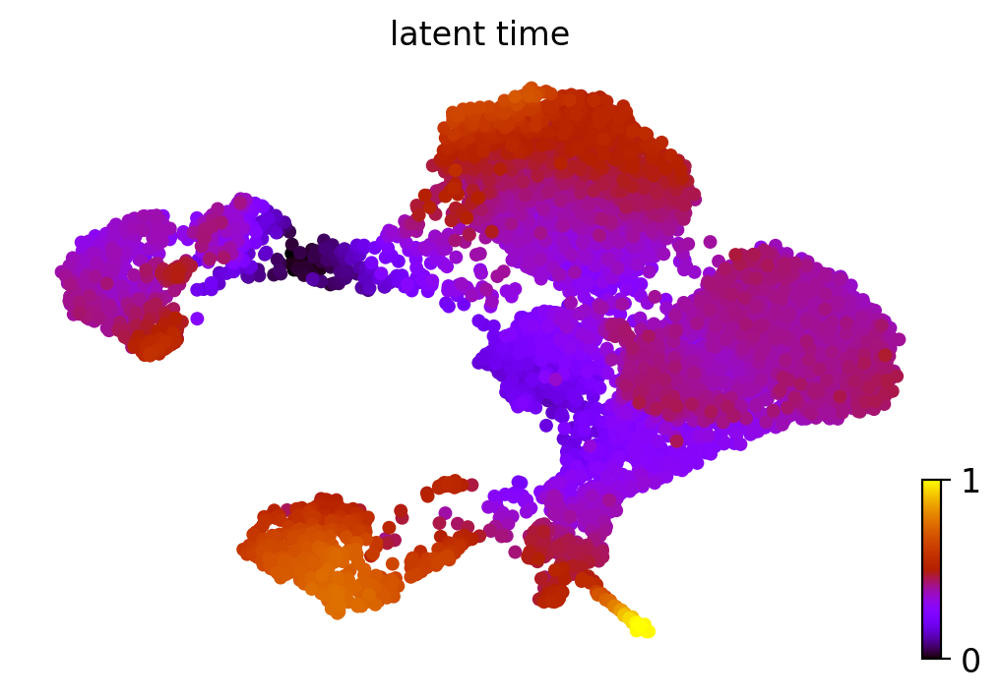

In [262]:
#scv.pl.velocity_embedding_stream(adata, basis='umap', size=100, dpi=200, linewidth=2)
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=100)

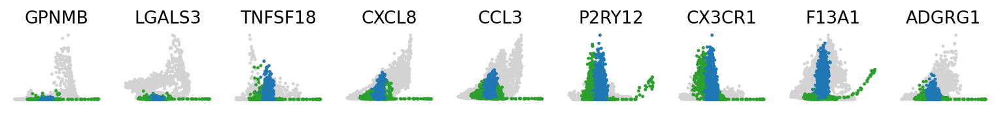

In [290]:
scv.pl.scatter(adata, x='latent_time', y=['GPNMB','LGALS3','TNFSF18',"CXCL8","CCL3",'P2RY12',"CX3CR1","F13A1",'ADGRG1'],groups = [str(2),str(0)],color='clusters',frameon=False)

In [11]:
import cellrank as cr
import numpy as np

In [7]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata)

In [8]:
vk.compute_transition_matrix()

<Velo>

In [9]:
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()

In [31]:
root_idx = np.where(adata.obs['clusters'] == 'Artery_1alpha_drivers = g.compute_lineage_drivers(lineages='Alpha', return_drivers=True)
alpha_drivers.sort_values(by="Alpha", ascending=False)')[0][0]
adata.uns['iroot'] = root_idx
sc.tl.dpt(adata)

In [32]:
from cellrank.tl.kernels import PalantirKernel
pk = PalantirKernel(adata, time_key='dpt_pseudotime').compute_transition_matrix()

In [33]:
from cellrank.tl.estimators import GPCCA
combined_kernel = 0.8 * vk + 0.2 * ck
g = GPCCA(combined_kernel)

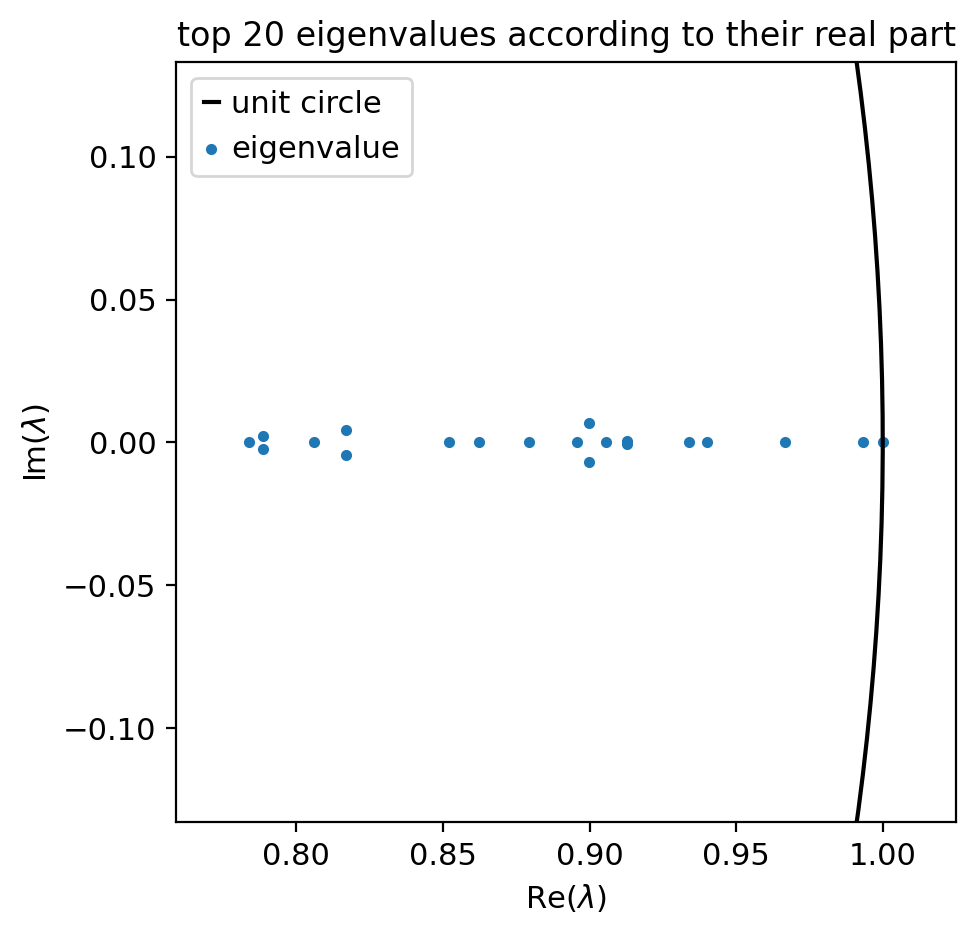

In [34]:
g.compute_schur(n_components=20)
g.plot_spectrum()

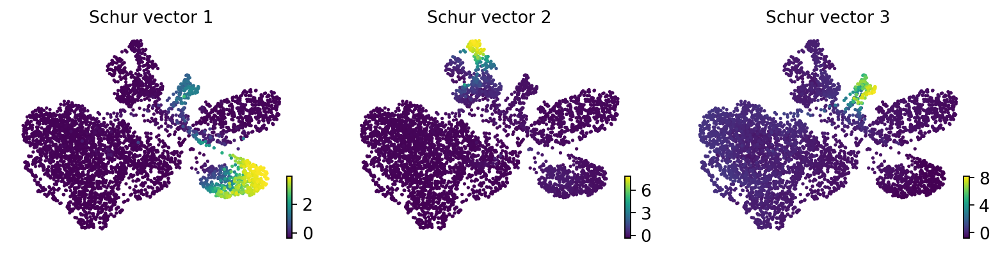

In [35]:
g.plot_schur(use=3)

INFO: Using pre-computed schur decomposition


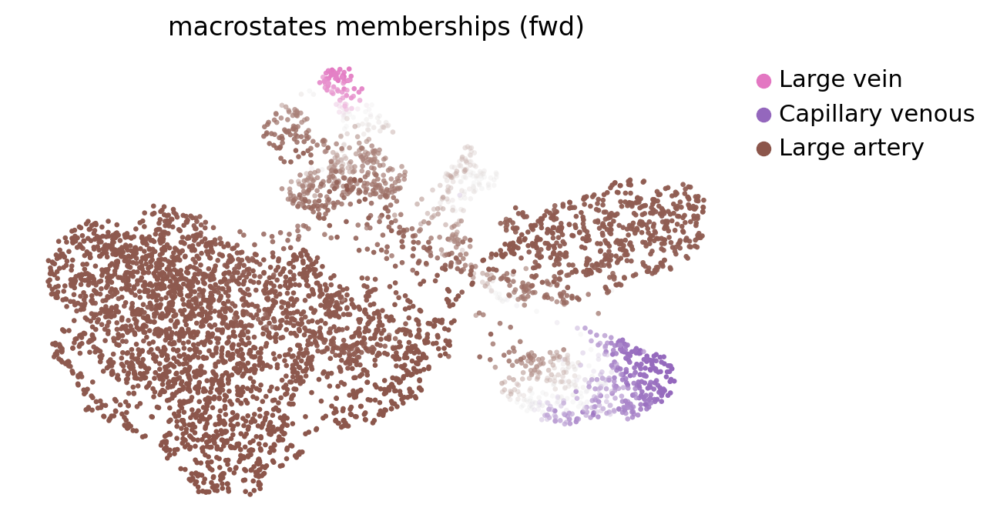

In [36]:
g.compute_macrostates(n_states=3, cluster_key='clusters')
g.plot_macrostates()


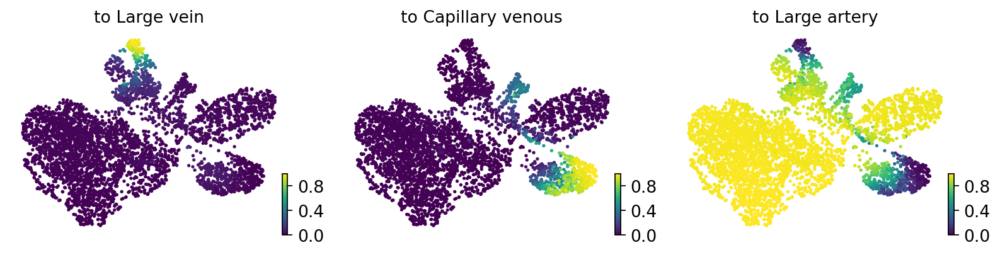

In [37]:
g.plot_macrostates(same_plot=False)

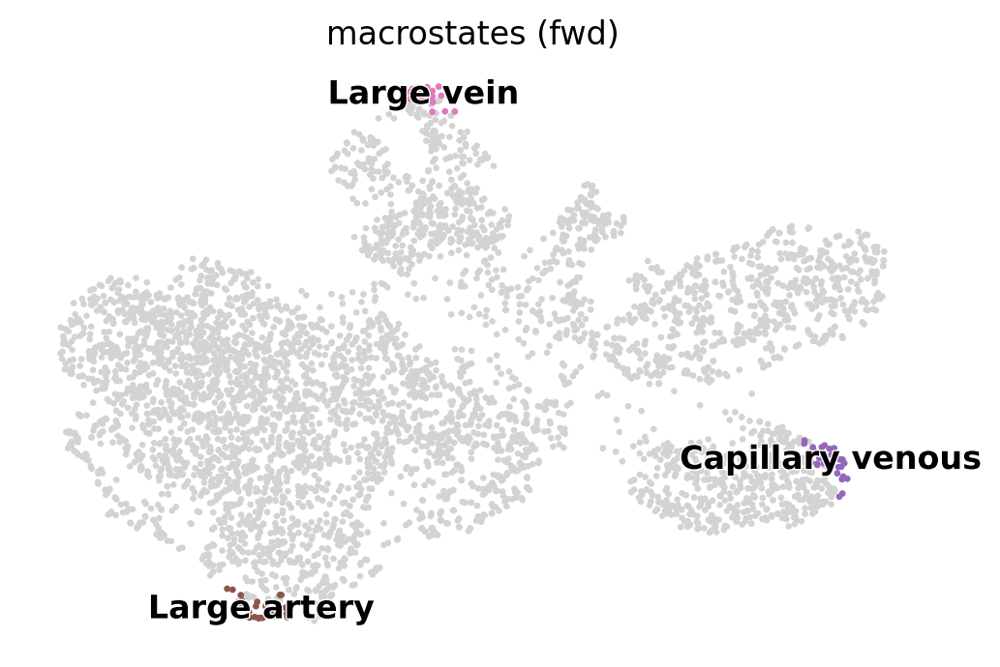

In [38]:
g.plot_macrostates(discrete=True)

In [39]:
g.set_terminal_states_from_macrostates()

In [40]:
g.compute_absorption_probabilities()

In [44]:
alpha_drivers = g.compute_lineage_drivers(lineages='Large_vein', return_drivers=True)
alpha_drivers.sort_values(by="Large_vein", ascending=False)

KeyError: 'Large_vein'

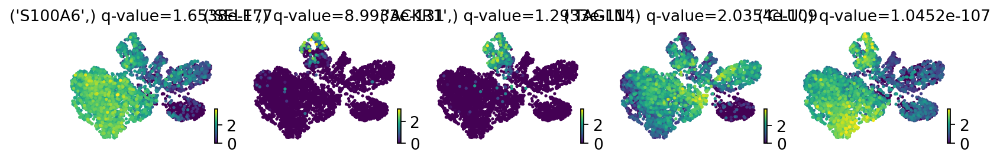

In [45]:
g.plot_lineage_drivers("Large_vein", n_genes=5, )